## YOLO

In [ ]:
## 1 - How do you load and run inference on a custom image using the YOLOv8 model (labeled as YOLOv9)
!pip install ultralytics
import cv2
from google.colab.patches import cv2_imshow

import numpy as np
import ultralytics
from ultralytics import YOLO

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.7/898.7 kB 13.1 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
model=YOLO('yolov8n.pt')

100%|██████████| 6.25M/6.25M [00:00<00:00, 33.0MB/s]


In [ ]:
image=cv2.imread('/content/my_img.jpg')

In [ ]:
result=model.predict(image,save=True)


0: 416x640 17 persons, 2 cars, 1 motorcycle, 1 truck, 1 umbrella, 1 handbag, 147.5ms
Speed: 4.8ms preprocess, 147.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
Results saved to runs/detect/predict



0: 416x640 17 persons, 2 cars, 1 motorcycle, 1 truck, 1 umbrella, 1 handbag, 252.7ms
Speed: 10.9ms preprocess, 252.7ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


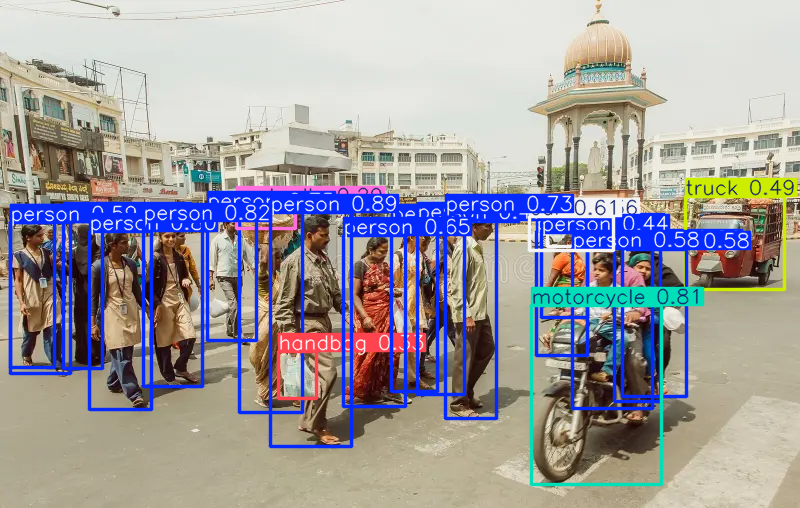

In [ ]:
rs=model(image)
cv2_imshow(result[0].plot())

In [ ]:
## 2 - How do you load the Faster RCNN model with a ResNet50 backbone and print its architecture6

In [ ]:
import tensorflow
import tensorflow_hub as hub

In [ ]:
model_url='https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_640x640/1'
model=hub.load(model_url)

In [ ]:
for layers in model.signatures.keys():
  print(layers)

serving_default


In [ ]:
# 3- How do you perform inference on an online image using the Faster RCNN model and print the predictions6
import tensorflow_hub as hub

# Load the Faster R-CNN model
model_url = "https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2"
model = hub.load(model_url)

In [ ]:
import tensorflow as tf
from PIL import Image
from io import BytesIO
import requests

# Load the online image
image_url = "https://djl.ai/examples/src/test/resources/dog_bike_car.jpg"
response = requests.get(image_url)
image = Image.open(BytesIO(response.content))

# Preprocess the image
image = image.resize((224, 224))  # Resize to 224x224
image = tf.keras.preprocessing.image.img_to_array(image)  # Convert to numpy array
image = tf.expand_dims(image, axis=0) / 255.0  # Normalize and add batch dimension

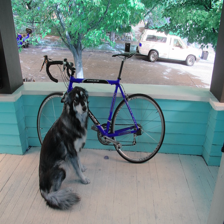

In [ ]:
image_np=image.numpy()
image_np=image_np[0]
image_np = np.uint8(image_np * 255)
cv2_imshow(image_np)
# original_image

In [ ]:
# Convert the input image to tf.uint8
image = tf.cast(image * 255, tf.uint8)

class_labels = outputs['detection_classes'].numpy()[0]
confidence_scores = outputs['detection_scores'].numpy()[0]
bounding_boxes = outputs['detection_boxes'].numpy()[0]

# Print the predictions
for i in range(len(class_labels)):
    print(f"Class Label: {class_labels[i]}")
    print(f"Confidence Score: {confidence_scores[i]:.2f}")
    print(f"Bounding Box Coordinates: {bounding_boxes[i]}")
    print("------------------------")

Class Label: 2.0
Confidence Score: 0.78
Bounding Box Coordinates: [    0.22101     0.16172     0.80425     0.72964]
------------------------
Class Label: 3.0
Confidence Score: 0.72
Bounding Box Coordinates: [    0.13819     0.59073     0.29662     0.89191]
------------------------
Class Label: 18.0
Confidence Score: 0.67
Bounding Box Coordinates: [    0.39287       0.171     0.94717     0.43126]
------------------------
Class Label: 17.0
Confidence Score: 0.61
Bounding Box Coordinates: [    0.39228     0.17096     0.94733     0.42591]
------------------------
Class Label: 8.0
Confidence Score: 0.51
Bounding Box Coordinates: [    0.13276     0.58806     0.28892     0.86881]
------------------------
Class Label: 3.0
Confidence Score: 0.42
Bounding Box Coordinates: [    0.20511     0.80999     0.29057     0.90635]
------------------------
Class Label: 1.0
Confidence Score: 0.41
Bounding Box Coordinates: [    0.15963    0.083823     0.21329     0.11604]
------------------------
Class Label

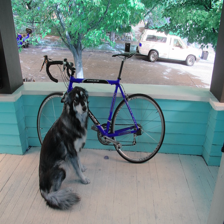

In [ ]:
# Visulize the bounding boxes
image_np=image.numpy().astype('uint8')
image_np=image_np[0]
image_np = np.uint8(image_np * 255)
cv2_imshow(image_np)



In [ ]:
for i in range(len(class_labels)):
    ymin, xmin, ymax, xmax = bounding_boxes[i]
    height, width, _ = image_np.shape



0: 480x640 2 persons, 5 cars, 1 bus, 1 handbag, 1335.8ms
Speed: 9.5ms preprocess, 1335.8ms inference, 28.3ms postprocess per image at shape (1, 3, 480, 640)


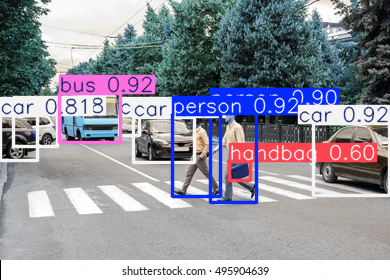

In [ ]:
# 4- How do you load an image and perform inference using YOLOv9, then display the detected objects with
# # bounding boxes and class labels
import ultralytics
from ultralytics import YOLO
# Load a pre-trained YOLOv9 model
model = YOLO("yolov9c.pt")

def detect_img(image_path):
  image=cv2.imread(image_path)
  img=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
  results=model(img)
  return cv2_imshow(results[0].plot())


image_path='/content/iimg.jpg'
detect_img(image_path)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


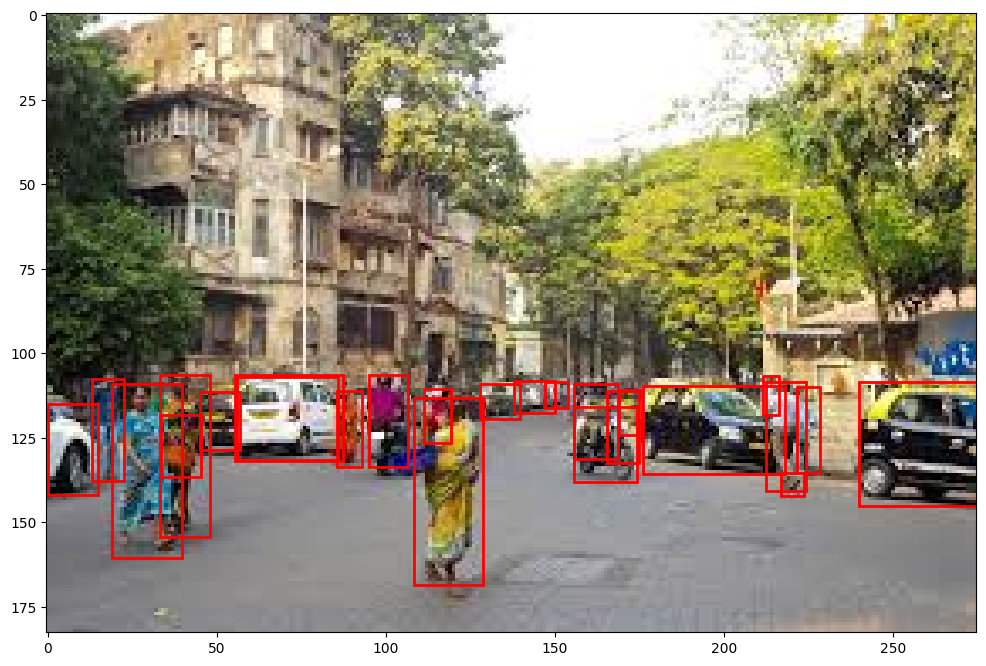

In [ ]:
# 5- How do you display bounding boxes for the detected objects in an image using Faster RCNN
import torch
import matplotlib.pyplot as plt
from torchvision import models, transforms
from PIL import Image, ImageDraw

# Load the pre-trained Faster R-CNN model
model = models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

# Load and preprocess the image
image = Image.open("/content/images.jpg")
transform = transforms.Compose([
    transforms.ToTensor(),
])
image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

# Run the image through the model
with torch.no_grad():
    prediction = model(image_tensor)

# Get the bounding boxes, labels, and scores
boxes = prediction[0]['boxes']
labels = prediction[0]['labels']
scores = prediction[0]['scores']

# Define a threshold to filter weak detections
threshold = 0.5
filtered_boxes = boxes[scores > threshold]
filtered_labels = labels[scores > threshold]

# Plot the image and bounding boxes
fig, ax = plt.subplots(1, figsize=(12, 9))
ax.imshow(image)

# Draw bounding boxes
for box in filtered_boxes:
    x1, y1, x2, y2 = box.tolist()
    rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none')
    ax.add_patch(rect)

# Show the image with bounding boxes
plt.show()


In [ ]:
# # 6- How do you perform inference on multiple images from a local folder using Faster RCNN and display the
# bounding boxes for each

import os
import tensorflow as tf
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from tensorflow.keras.preprocessing.image import load_img


In [ ]:
cd /content/Pretrained_model

/content/Pretrained_model


In [ ]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8.tar.gz

--2024-12-13 09:47:21--  http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.251.163.207, 142.251.167.207, 142.251.16.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|142.251.163.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 212150153 (202M) [application/x-tar]
Saving to: ‘faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8.tar.gz’

faster_rcnn_resnet5 100%[===================>] 202.32M   167MB/s    in 1.2s    

2024-12-13 09:47:22 (167 MB/s) - ‘faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8.tar.gz’ saved [212150153/212150153]



In [ ]:
!tar -xvf faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8.tar.gz

faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/checkpoint/
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/checkpoint/checkpoint
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/checkpoint/ckpt-0.index
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/pipeline.config
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/saved_model/
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/saved_model/saved_model.pb
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/saved_model/variables/
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/saved_model/variables/variables.data-00000-of-00001
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/saved_model/variables/variables.index


In [ ]:
model=tf.saved_model.load('/content/Pretrained_model/faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/saved_model')

In [ ]:
# Get the inference function
infer = model.signatures['serving_default']

In [ ]:
input_tensor = model.signatures['serving_default'].inputs[0]  # Access the first element of the list
output_tensor = model.signatures['serving_default'].outputs[0]  # Access the first element of the list
output_tensor_scores = model.signatures['serving_default'].outputs[1]  # Access the second element of the list
output_tensor_classes = model.signatures['serving_default'].outputs[2]  # Access the third element of the list

In [ ]:
# Define the folder path containing the images
image_folder = '/content/image_folder/train'
# Process only the first 3 images


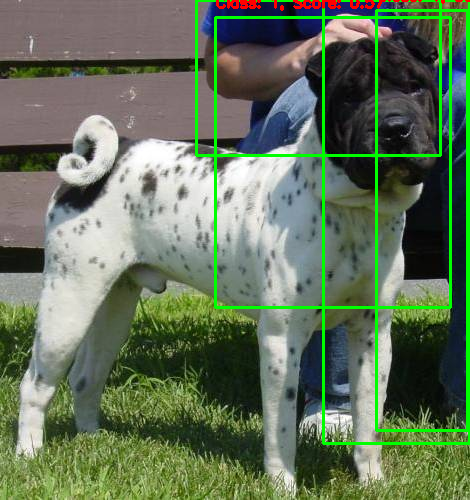

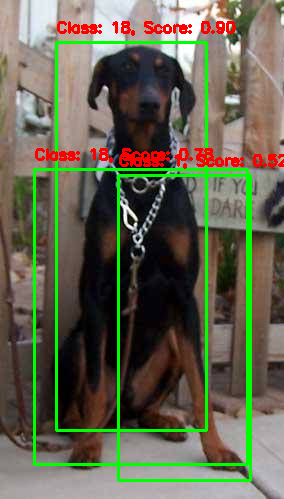

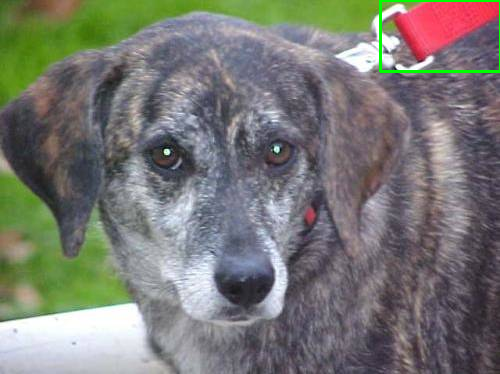

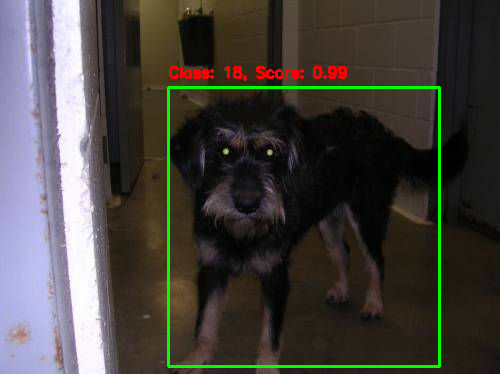

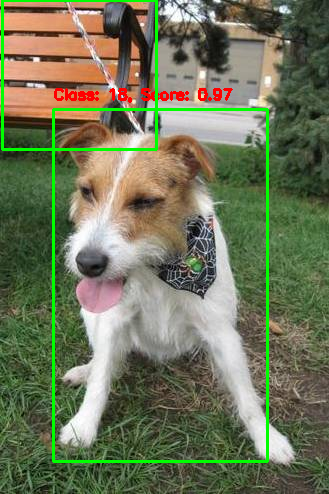

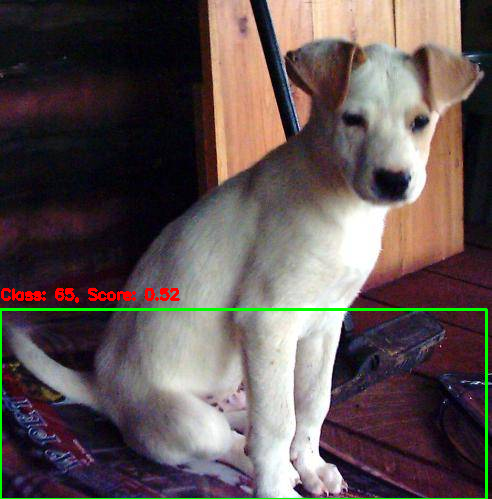

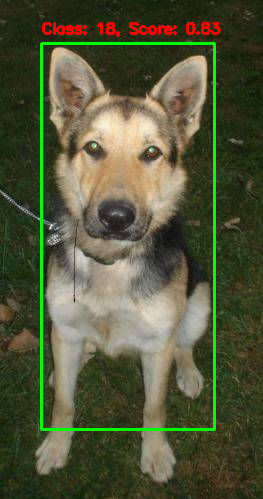

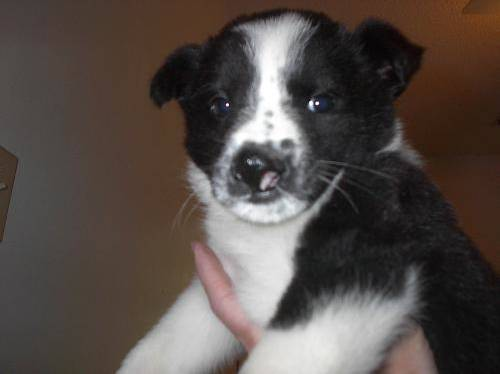

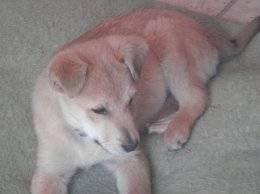

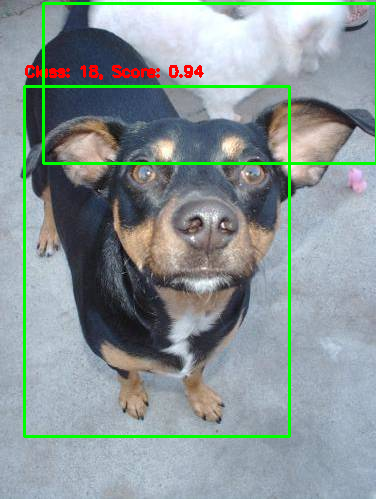

KeyboardInterrupt: 

In [ ]:
for filename in os.listdir(image_folder):
    # Load the image using OpenCV
    image = cv2.imread(os.path.join(image_folder, filename))

    # Convert the image to RGB format
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Resize the image to the input size of the model
    input_size = (1024, 1024)  # Replace with your model's input size
    image_resized = cv2.resize(image_rgb, input_size)

    # Expand the dimensions of the image to include the batch size
    image_expanded = np.expand_dims(image_resized, axis=0)

    # Perform inference on the image
    outputs = model.signatures['serving_default'](input_tensor=tf.constant(image_expanded))

    # Extract the detection boxes, scores, and classes
    boxes = outputs['detection_boxes'].numpy()[0]
    scores = outputs['detection_scores'].numpy()[0]
    classes = outputs['detection_classes'].numpy()[0]

    # Draw the bounding boxes on the original image
    for i in range(len(scores)):
        if scores[i] > 0.5:  # Adjust the confidence threshold as needed
            # Scale the box coordinates to the original image size
            box = boxes[i] * np.array([image.shape[0], image.shape[1], image.shape[0], image.shape[1]])

            # Draw the bounding box
            cv2.rectangle(image, (int(box[1]), int(box[0])), (int(box[3]), int(box[2])), (0, 255, 0), 2)

            # Display the class label and confidence score
            cv2.putText(image, f'Class: {int(classes[i])}, Score: {scores[i]:.2f}', (int(box[1]), int(box[0]) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

    # Display the output image
    cv2_imshow(image)




image 1/1 /content/street.jpg: 480x640 3 cars, 224.6ms
Speed: 4.5ms preprocess, 224.6ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


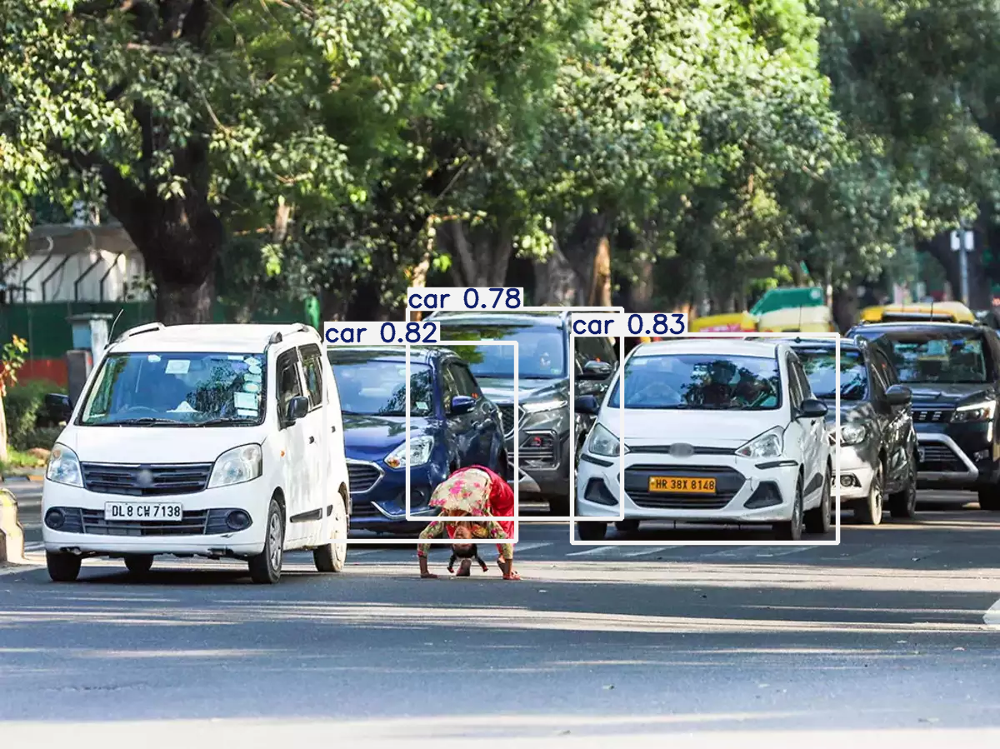

Confidence: 0.83, Class: 2.0, XYXY: [[     686.53      401.97        1006      651.58]]
bounding box : [[     686.53      401.97        1006      651.58]]
Confidence: 0.82, Class: 2.0, XYXY: [[     389.81      411.41      619.59      649.44]]
bounding box : [[     389.81      411.41      619.59      649.44]]
Confidence: 0.78, Class: 2.0, XYXY: [[     489.84      370.16      746.67      622.29]]
bounding box : [[     489.84      370.16      746.67      622.29]]


In [ ]:
# 7= How can you change the confidence threshold for YOLO object detection and filter out low-confidence
!pip install ultralytics
import cv2
from google.colab.patches import cv2_imshow


from ultralytics import YOLO

# Load a pre-trained model
model = YOLO('yolov8n.pt')  # Replace with 'yolov8x.pt' for a larger model

# Set the confidence threshold
confidence_threshold = 0.7

# Perform inference on an image
results = model('/content/street.jpg', conf=confidence_threshold)

# Display the results
cv2_imshow(results[0].plot())

for box in results[0].boxes:
    confidence = box.conf.item()
    cls=box.cls.item()
    xyxy=box.xyxy.cpu().numpy()

    if confidence > confidence_threshold:
      print(f"Confidence: {confidence:.2f}, Class: {cls}, XYXY: {xyxy}")
      print(f'bounding box : {xyxy}')



11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 9ms/step - accuracy: 0.8711 - loss: 0.4330 - val_accuracy: 0.9531 - val_loss: 0.1511
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.9689 - loss: 0.1037 - val_accuracy: 0.9716 - val_loss: 0.0993
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.9782 - loss: 0.0688 - val_accuracy: 0.9689 - val_loss: 0.1018
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.9851 - loss: 0.0482 - val_accuracy: 0.9772 - val_loss: 0.0777
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.9879 - loss: 0.0392 - val_accuracy: 0.9711 - val_loss: 0.0976


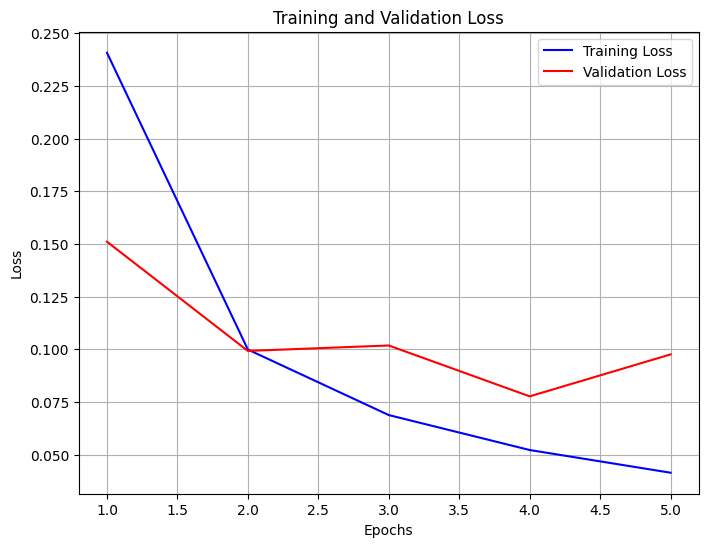

In [ ]:
#  8 How do you plot the training and validation loss curves for model evaluation

import numpy as np
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.datasets import mnist
import matplotlib.pyplot as plt

# Load and preprocess the data
(x_train, y_train), (x_val, y_val) = mnist.load_data()

# Normalize the pixel values to range [0, 1]
x_train = x_train / 255.0
x_val = x_val / 255.0

# Define a simple model
model = Sequential([
    Flatten(input_shape=(28, 28)),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(10, activation='softmax')
])

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(
    x_train, y_train,
    validation_data=(x_val, y_val),
    epochs=5,
    batch_size=32
)

# Extract training and validation loss
training_loss = history.history['loss']
validation_loss = history.history['val_loss']

# Plot the loss curves
epochs = range(1, len(training_loss) + 1)

plt.figure(figsize=(8, 6))
plt.plot(epochs, training_loss, 'b', label='Training Loss')
plt.plot(epochs, validation_loss, 'r', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


In [1]:
# How do you visualize the confidence scores alongside the bounding boxes for detected objects using Faster
# RCNN

!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8.tar.gz

--2024-12-16 06:58:13--  http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 173.194.202.207, 74.125.142.207, 74.125.195.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|173.194.202.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 212150153 (202M) [application/x-tar]
Saving to: ‘faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8.tar.gz’

faster_rcnn_resnet5 100%[===================>] 202.32M   142MB/s    in 1.4s    

2024-12-16 06:58:15 (142 MB/s) - ‘faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8.tar.gz’ saved [212150153/212150153]



In [2]:
!tar -xvf faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8.tar.gz

faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/checkpoint/
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/checkpoint/checkpoint
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/checkpoint/ckpt-0.index
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/pipeline.config
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/saved_model/
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/saved_model/saved_model.pb
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/saved_model/variables/
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/saved_model/variables/variables.data-00000-of-00001
faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/saved_model/variables/variables.index


In [3]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from PIL import Image
import cv2


In [4]:
# Load the TensorFlow SavedModel
model_dir = "/content/faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8/saved_model"  #
detect_fn = tf.saved_model.load(model_dir)

In [5]:
# perform  inference

def detect_objects(detect_fc,image_np):
  input_tensor=tf.convert_to_tensor(image_np)
  input_tensor=input_tensor[tf.newaxis,...]
  detections=detect_fn(input_tensor)
  return detections


In [13]:
# load imagde
def load_image(image_path):
  image=Image.open(image_path).convert('RGB')
  image_np=np.array(image)
  return image_np

In [8]:
# draw bounding boxex  and confidence score

def visulize_detections(image_np,detections,threshold=0.5):
  boxes=detections['detection_boxes'][0].numpy()
  classes=detections['detection_classes'][0].numpy().astype(np.int32)
  scores=detections['detection_scores'][0].numpy()

  hight,width,_=image_np.shape
  image_with_boxes=image_np.copy()

  for i in range(len(scores)):
    if scores[i]>threshold:
      ymin,xmin,ymax,xmax=boxes[i]
      (star_x,strar_y,end_x,end_y)=(int(xmin*width),int(ymin*hight),int(xmax*width),int(ymax*hight))

      cv2.rectangle(image_with_boxes,(star_x,strar_y),(end_x,end_y),(0,255,0),2)

      # display confidence score
      label=f"Score : {scores[i]:.2f}"
      cv2.putText(image_with_boxes,label,(star_x,strar_y-10),cv2.FONT_HERSHEY_SIMPLEX,0.5,(0,255,0),2)

  return image_with_boxes

In [9]:
# main funciton
def main():
  image_path='/content/traffic-on-the-streets-of-bhopal-in-india-TRKPFD.jpg'
  image_np=load_image(image_path)
  detections=detect_objects(detect_fn,image_np)

  image_with_boxes=visulize_detections(image_np,detections,threshold=0.5)

  cv2_imshow(image_with_boxes)


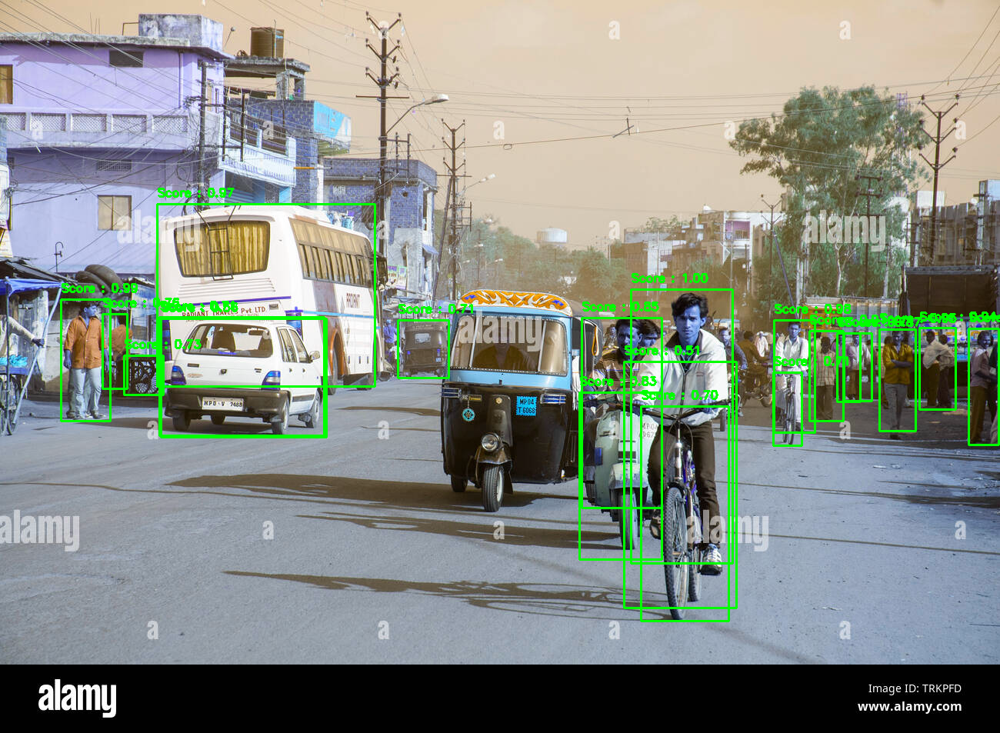

In [16]:
from google.colab.patches import cv2_imshow
if __name__=='__main__':
  main()

In [41]:
# How can you save the inference results (with bounding boxes) as a new image after performing detection
# # using YOLO?

!pip install ultralytics
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from ultralytics import YOLO

In [46]:
model=YOLO('yolov8n.pt')
img=cv2.imread('/content/traffic-on-the-streets-of-bhopal-in-india-TRKPFD.jpg')


In [47]:
result=model(img)


0: 480x640 12 persons, 4 bicycles, 1 car, 1 bus, 1 truck, 201.4ms
Speed: 6.1ms preprocess, 201.4ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


In [48]:
detections=result[0].boxes

In [50]:

  # Draw bounding boxes on the image
  for detection in detections:
      x1, y1, x2, y2 = map(int, detection.xyxy[0].tolist())  # Bounding box coordinates
      conf = detection.conf[0].item()  # Confidence score
      cls = int(detection.cls[0].item())  # Class ID
      label = f"{model.names[cls]} {conf:.2f}"  # Label with class name and confidence

      # Draw the bounding box
      cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
      # Put label text above the bounding box
      cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

  # Save the image with bounding boxes
  output_path = "content.jpg"  # Replace with the desired output path
  cv2.imwrite(output_path, img)

  print(f"Image saved with bounding boxes at {output_path}")

Image saved with bounding boxes at content.jpg
